In [1]:
import arviz
import matplotlib.pyplot as plt
import pandas as pd
from utils.model_builder import ModelBuilder
from utils.posteriorplots import predictive_plot, retrodictive_plot

In [2]:
arviz.style.use("arviz-darkgrid")
arviz.rcParams["plot.max_subplots"] = 50

In [3]:
%load_ext autoreload
%autoreload 2

## Model with socio-eco predictors

In [162]:
election_date = "2022-04-10"
mb = ModelBuilder(
    election_to_predict=election_date,
    test_cutoff=None,
    variance_weight=[0.1, 0.2, 0.2, 0.2, 0.1, 0.1, 0.1],
    lengthscale=[5, 14, 28, 42, 56, 70, 84],
)

/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.9/site-packages/pandas/core/algorithms.py:431: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior.  In a future version these will be considered non-comparable.Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  uniques = table.unique(values)
/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.9/site-packages/pandas/core/indexes/base.py:2023: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior.  In a future version these will be considered non-comparable.Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  return self._engine.is_unique
/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.9/site-packages/pandas/core/indexes/base.py:3512: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the 

In [163]:
hierarchical_dm = mb.build_model()

In [164]:
idata_hierarchical_dm = mb.sample_all(
#    draws=500,
#    target_accept=0.9,
    var_names=[
        "latent_popularity",
        "latent_pop_t0",
        "R",
        "noisy_popularity",
        "N_approve",
    ],
)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_election_party_amplitude, lsd_party_effect_party_amplitude, lsd_intercept, unemployment_effect, house_election_effects_raw, house_election_effects_sd, house_effects, poll_bias, election_party_intercept, election_party_intercept_sd_party_effect, election_party_intercept_sd_intercept, party_intercept, party_intercept_sd]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 968 seconds.
The number of effective samples is smaller than 25% for some parameters.


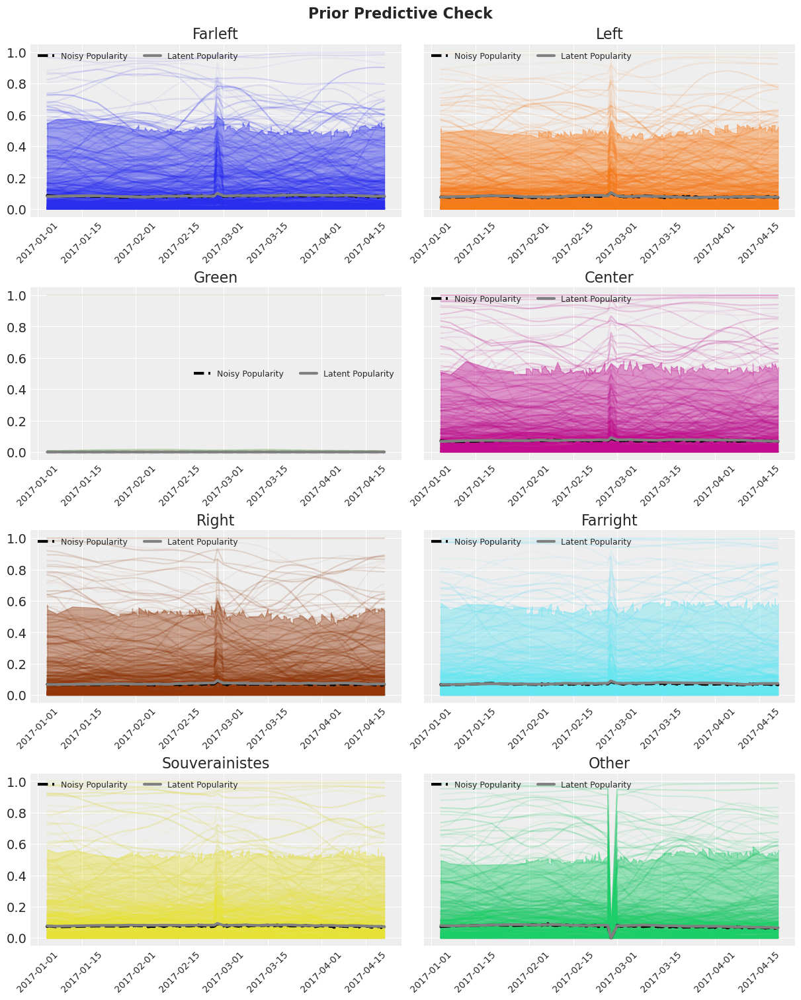

In [165]:
polls_train = mb.polls_train.copy()
retrodictive_plot(
    idata_hierarchical_dm.sel(
        elections="2017-04-23",
        observations=polls_train[polls_train.dateelection == "2017-04-23"].index,
    ),
    mb.parties_complete,
    polls_train[polls_train.dateelection == "2017-04-23"],
    group="prior",
)

In [166]:
election_forecast = mb.forecast_election(idata_hierarchical_dm)
results = mb.results_raw.copy()
polls_test = mb.polls_test.copy()

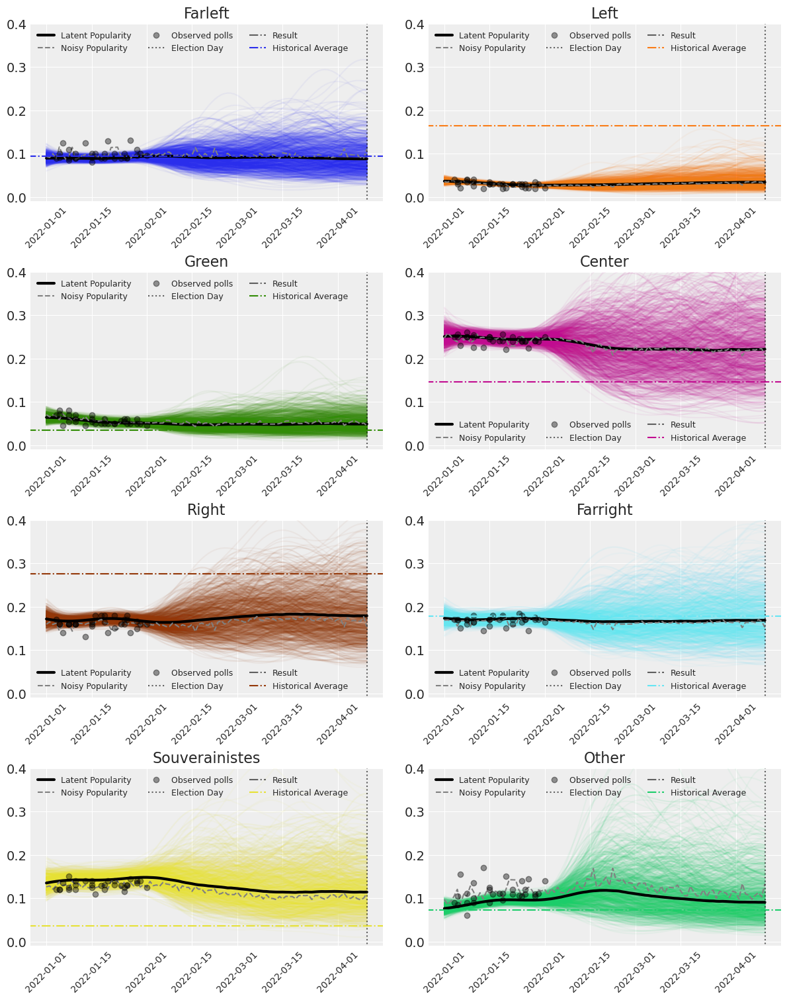

In [167]:
predictive_plot(
    election_forecast,
    mb.parties_complete,
    election_date,
    results[results.dateelection == election_date],
    polls_train[polls_train.dateelection == election_date],
    polls_test[polls_test.dateelection == election_date],
)

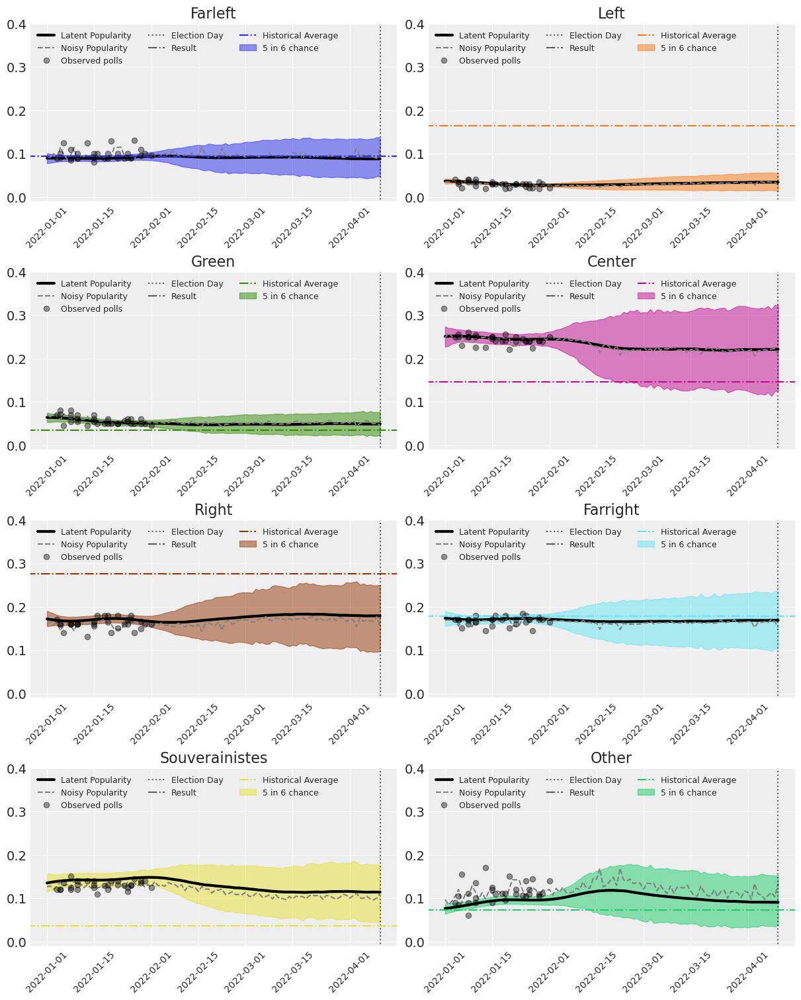

In [168]:
predictive_plot(
    election_forecast,
    mb.parties_complete,
    election_date,
    results[results.dateelection == election_date],
    polls_train[polls_train.dateelection == election_date],
    polls_test[polls_test.dateelection == election_date],
    hdi=True
)

In [169]:
summary = arviz.summary(idata_hierarchical_dm, round_to=2)
low_ess = summary[(summary.ess_bulk <= 1000) | (summary.ess_tail <= 1000)]

In [170]:
summary[(summary.ess_bulk <= 400) | (summary.ess_tail <= 400)]

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat


In [171]:
low_ess[
    (~low_ess.index.str.startswith("noisy"))
    & (~low_ess.index.str.startswith("latent"))
    & (~low_ess.index.str.startswith("election_party_time_effect"))
]

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"election_party_intercept[2022-04-10T00:00:00.000000000, other]",0.24,0.18,-0.12,0.57,0.01,0.00,762.47,964.83,1.00
"party_time_effect[9, other]",-0.05,0.06,-0.16,0.08,0.00,0.00,980.89,1592.74,1.00
"party_time_effect[10, other]",-0.06,0.06,-0.17,0.06,0.00,0.00,956.75,1565.42,1.00
"party_time_effect[11, other]",-0.07,0.06,-0.18,0.05,0.00,0.00,939.98,1627.35,1.00
"party_time_effect[12, other]",-0.08,0.06,-0.20,0.04,0.00,0.00,927.50,1666.27,1.00
...,...,...,...,...,...,...,...,...,...
"election_party_time_coefs[5, other, 2022-04-10T00:00:00.000000000]",0.74,0.81,-0.67,2.32,0.03,0.02,939.89,1526.05,1.00
"election_party_time_coefs[6, other, 2022-04-10T00:00:00.000000000]",-1.11,0.68,-2.47,0.09,0.02,0.02,961.31,1737.22,1.00
"election_party_time_coefs[7, other, 2002-04-21T00:00:00.000000000]",-0.59,0.25,-1.05,-0.13,0.01,0.01,950.55,1390.71,1.00
"election_party_time_coefs[7, other, 2012-04-22T00:00:00.000000000]",0.72,0.26,0.24,1.18,0.01,0.01,995.79,1310.63,1.00


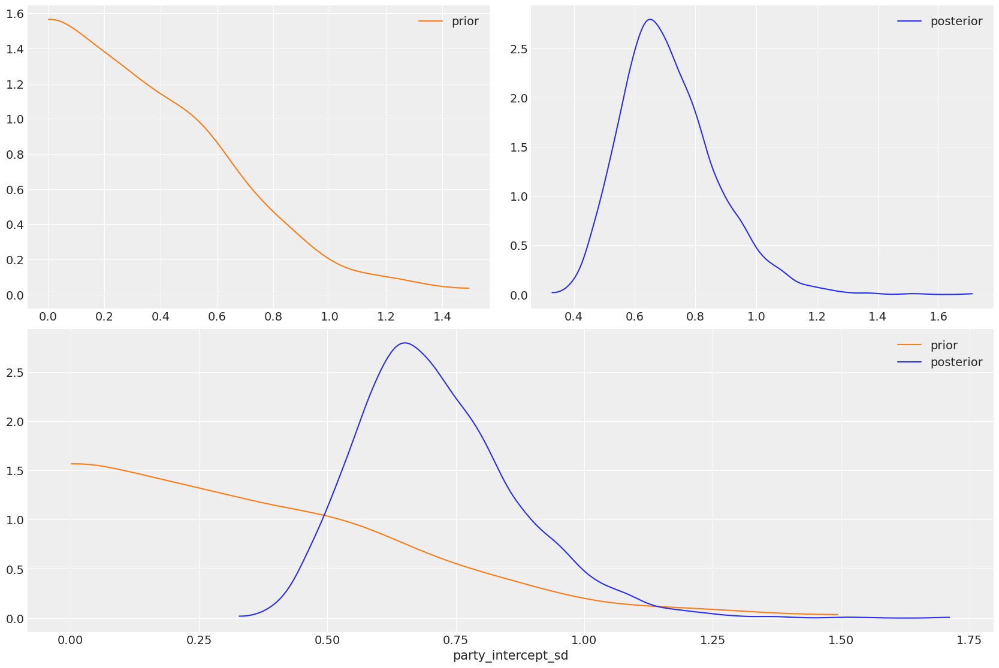

In [172]:
arviz.plot_dist_comparison(idata_hierarchical_dm, var_names="party_intercept_sd");

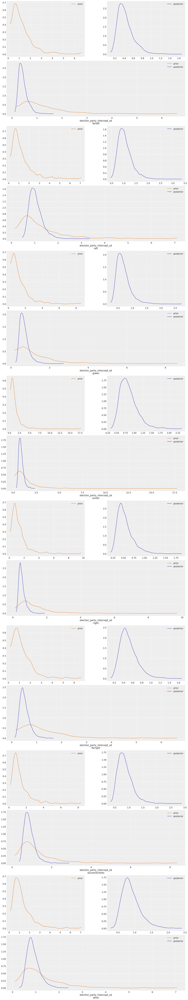

In [173]:
arviz.plot_dist_comparison(idata_hierarchical_dm, var_names="election_party_intercept_sd");

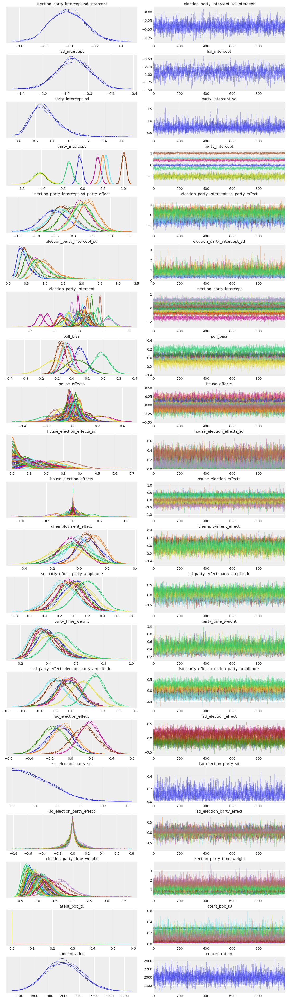

In [174]:
arviz.plot_trace(
    idata_hierarchical_dm,
    var_names=[
        "~time_effect",
        "~time_coefs",
        "~latent_popularity",
        "~noisy_popularity",
        "~raw",
    ],
    filter_vars="regex",
);

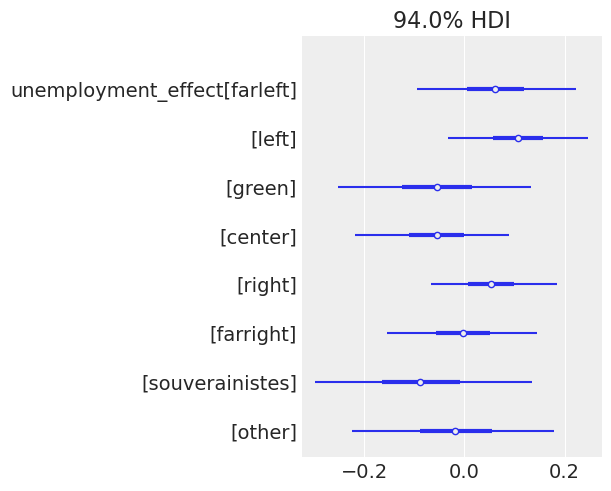

In [175]:
arviz.plot_forest(election_forecast, var_names="unemployment_effect", combined=True);

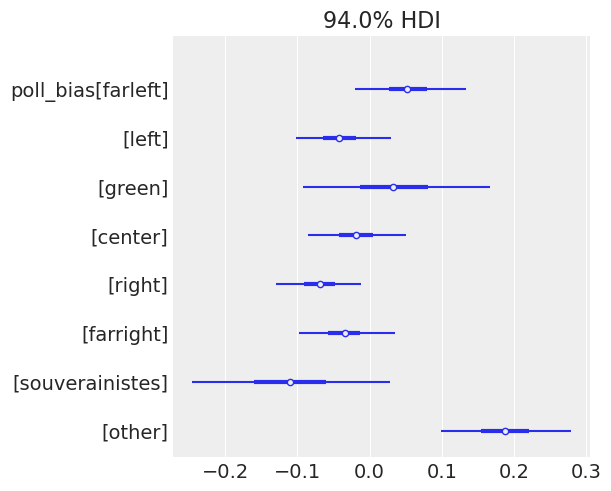

In [176]:
arviz.plot_forest(election_forecast, var_names="poll_bias", combined=True);

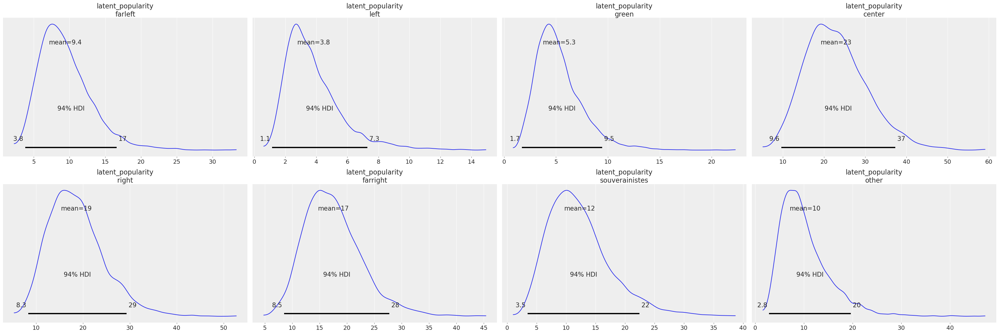

In [177]:
arviz.plot_posterior(
    election_forecast.predictions["latent_popularity"].sel(observations="2022-04-10")
    * 100,
);

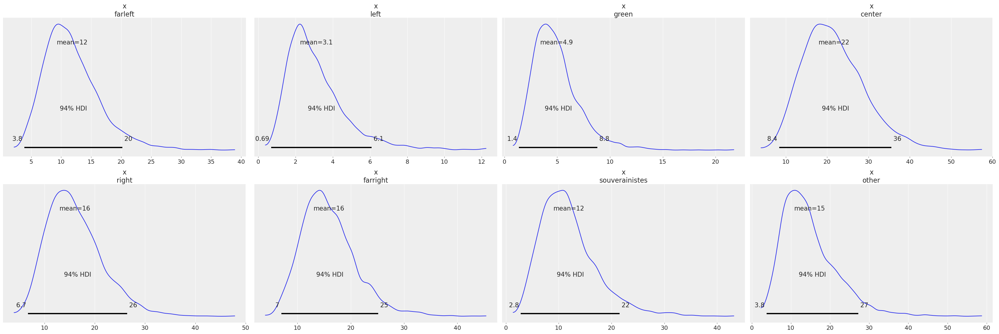

In [178]:
arviz.plot_posterior(
    (
        election_forecast.predictions["N_approve"]
        / election_forecast.predictions_constant_data["observed_N"]
    ).sel(observations="2022-04-10")
    * 100,
);

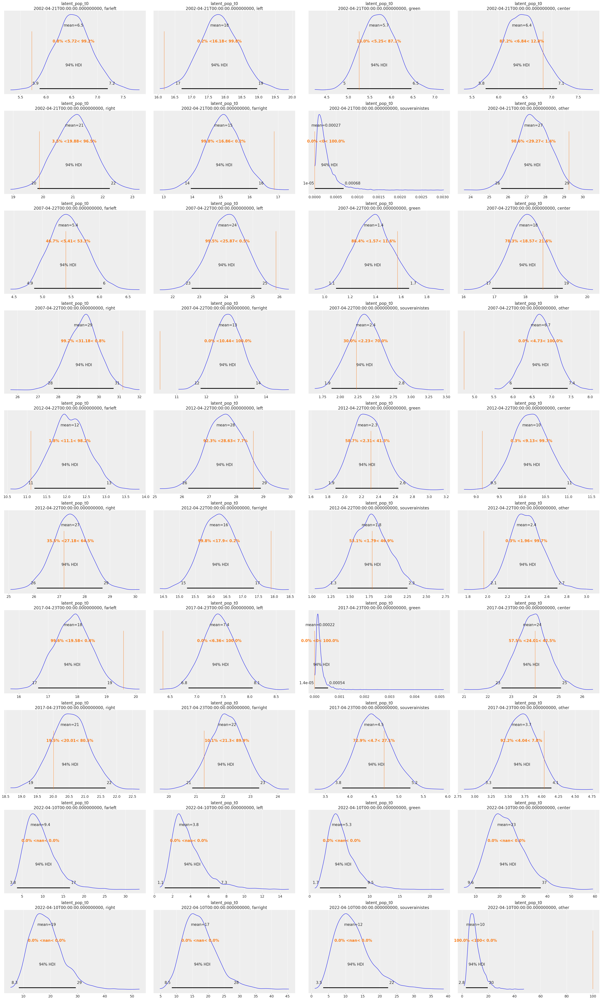

In [179]:
arviz.plot_posterior(
    election_forecast.predictions["latent_pop_t0"] * 100,
    ref_val=results[mb.parties_complete].to_numpy().flatten().tolist(),
);

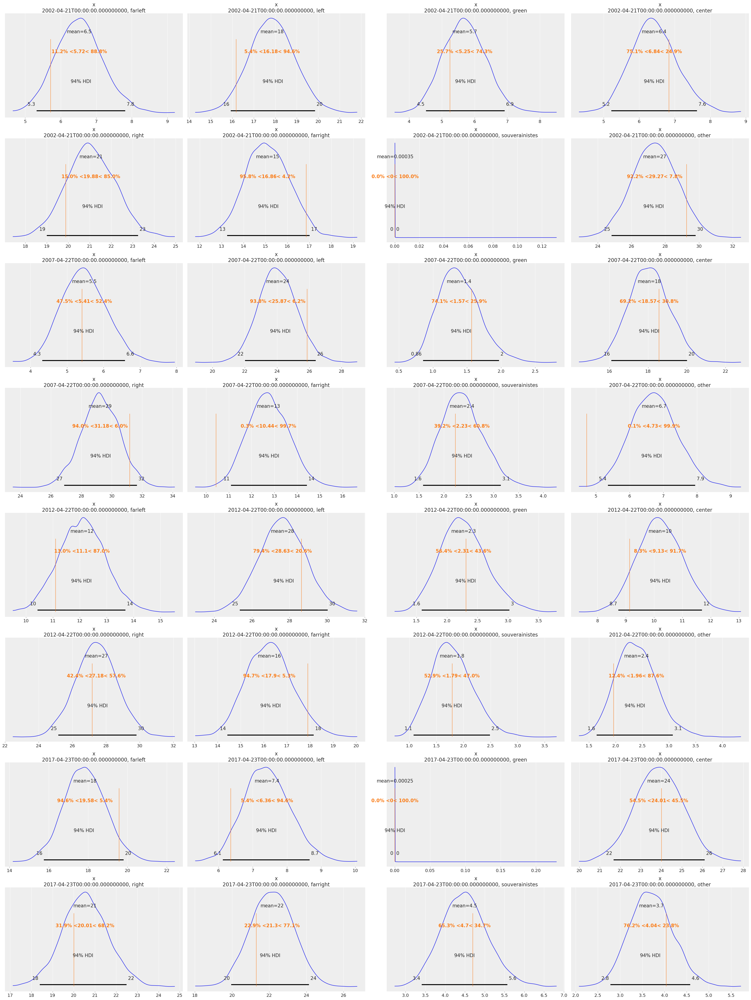

In [180]:
arviz.plot_posterior(
    (
        election_forecast.predictions["R"]
        / election_forecast.predictions_constant_data["results_N"]
    )
    * 100,
    ref_val=results[mb.parties_complete].to_numpy().flatten().tolist(),
);